In [9]:
import os
import numpy as np
from tqdm import tqdm
import cv2 as cv
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

from keras import Model
from keras.callbacks import Callback
from keras.optimizers import Adam
from keras.utils import plot_model
from keras.layers import Input, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate, Dropout

In [10]:
image_path = '../temp/training/Images/'
mask_path = '../temp/training/Masks/'
SIZE = 128

In [11]:
# lists of images and masks names
image_names = sorted(next(os.walk(image_path))[-1])
mask_names = sorted(next(os.walk(mask_path))[-1])

images = np.zeros(shape=(len(image_names),SIZE, SIZE, 3))
masks = np.zeros(shape=(len(image_names),SIZE, SIZE, 1))

for id in tqdm(range(len(image_names)), desc="Images"):
  path = image_path + image_names[id]
  img = np.asarray(Image.open(path)).astype('float')/255.
  img = cv.resize(img, (SIZE,SIZE), cv.INTER_AREA)
  images[id] = img

for id in tqdm(range(len(mask_names)), desc="Mask"):
  path = mask_path + mask_names[id]
  mask = np.asarray(Image.open(path)).astype('float')/255.
  mask = cv.resize(mask, (SIZE,SIZE), cv.INTER_AREA)
  masks[id] = mask[:,:,:1]

Mask: 100%|██████████| 7542/7542 [00:09<00:00, 824.11it/s] 


In [12]:
# Train test split
# images_train, images_test, mask_train, mask_test = train_test_split(images, masks, test_size=0.01)

# Train test split with no images left for testing
images_train = images
images_test = []
mask_train = masks
mask_test = []

print(f'Train images: {len(images_train)}')
print(f'Test images: {len(images_test)}')

Train images: 7542
Test images: 0


In [14]:
# Define U-net architecture
def unet_model(input_layer, start_neurons):
    # Contraction path
    conv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(input_layer)
    conv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(conv1)
    pool1 = MaxPooling2D((2, 2))(conv1)
    pool1 = Dropout(0.25)(pool1)

    conv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(pool1)
    conv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(conv2)
    pool2 = MaxPooling2D((2, 2))(conv2)
    pool2 = Dropout(0.5)(pool2)

    conv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(pool2)
    conv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(conv3)
    pool3 = MaxPooling2D((2, 2))(conv3)
    pool3 = Dropout(0.5)(pool3)

    conv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(pool3)
    conv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(conv4)
    pool4 = MaxPooling2D((2, 2))(conv4)
    pool4 = Dropout(0.5)(pool4)

    # Middle
    convm = Conv2D(start_neurons*16, kernel_size=(3, 3), activation="relu", padding="same")(pool4)
    convm = Conv2D(start_neurons*16, kernel_size=(3, 3), activation="relu", padding="same")(convm)
    
    # Expansive path
    deconv4 = Conv2DTranspose(start_neurons*8, kernel_size=(3, 3), strides=(2, 2), padding="same")(convm)
    uconv4 = concatenate([deconv4, conv4])
    uconv4 = Dropout(0.5)(uconv4)
    uconv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(uconv4)
    uconv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(uconv4)

    deconv3 = Conv2DTranspose(start_neurons*4, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv4)
    uconv3 = concatenate([deconv3, conv3])
    uconv3 = Dropout(0.5)(uconv3)
    uconv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(uconv3)
    uconv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(uconv3)

    deconv2 = Conv2DTranspose(start_neurons*2, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv3)
    uconv2 = concatenate([deconv2, conv2])
    uconv2 = Dropout(0.5)(uconv2)
    uconv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(uconv2)
    uconv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(uconv2)

    deconv1 = Conv2DTranspose(start_neurons*1, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv2)
    uconv1 = concatenate([deconv1, conv1])
    uconv1 = Dropout(0.5)(uconv1)
    uconv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(uconv1)
    uconv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(uconv1)
    
    # Last conv and output
    output_layer = Conv2D(1, (1,1), padding="same", activation="sigmoid")(uconv1)
    
    return output_layer

In [15]:
# Compile unet model
input_layer = Input((SIZE, SIZE, 3))
output_layer = unet_model(input_layer = input_layer, start_neurons = 16)

model = Model(input_layer, output_layer)
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
model.summary()

I0000 00:00:1743310810.710350   34340 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9005 MB memory:  -> device: 0, name: NVIDIA GeForce GTX 1080 Ti, pci bus id: 0000:01:00.0, compute capability: 6.1


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │        448 │ input_layer[0][0] │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 128, 128,  │      2,320 │ conv2d[0][0]      │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 64, 64,    │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 64, 64,    │          0 │ max_pooling2d[0]… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 64, 64,    │      4,640 │ dropout[0][0]     │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 64, 64,    │      9,248 │ conv2d_2[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 32, 32,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 32, 32,    │          0 │ max_pooling2d_1[… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 32, 32,    │     18,496 │ dropout_1[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 32, 32,    │     36,928 │ conv2d_4[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 16, 16,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 16, 16,    │          0 │ max_pooling2d_2[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 16, 16,    │     73,856 │ dropout_2[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 16, 16,    │    147,584 │ conv2d_6[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 8, 8, 128) │          0 │ conv2d_7[0][0]    │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 8, 8, 128) │          0 │ max_pooling2d_3[

 Total params: 2,158,705 (8.23 MB)

 Trainable params: 2,158,705 (8.23 MB)

 Non-trainable params: 0 (0.00 B)

In [16]:
# Post Process
def mask_threshold(image, threshold=0.25):
  return image>threshold

# Callback to show progress of learning on the images after each epoch
class ShowProgress(Callback):
  def __init__(self, save=False):
    self.save = save
  def on_epoch_end(self, epoch, logs=None):
    k = np.random.randint(len(images_train))
    original_image = images_train[k][np.newaxis,...]
    predicted_mask = self.model.predict(original_image).reshape(128,128)
    proc_mask02 = mask_threshold(predicted_mask, threshold=0.2)
    proc_mask03 = mask_threshold(predicted_mask, threshold=0.3)
    proc_mask04 = mask_threshold(predicted_mask, threshold=0.4)
    proc_mask05 = mask_threshold(predicted_mask, threshold=0.5)
    mask = mask_train[k].reshape(128,128)

    plt.figure(figsize=(15,10))

    plt.subplot(1,7,1)
    plt.imshow(original_image[0]);plt.title('Orginal Image')

    plt.subplot(1,7,2)
    plt.imshow(predicted_mask, cmap='gray');plt.title('Predicted Mask')
    
    plt.subplot(1,7,3)
    plt.imshow(mask, cmap='gray');plt.title('Orginal Mask')

    plt.subplot(1,7,4)
    plt.imshow(proc_mask02, cmap='gray');plt.title('Processed: 0.2')

    plt.subplot(1,7,5)
    plt.imshow(proc_mask03, cmap='gray');plt.title('Processed: 0.3')

    plt.subplot(1,7,6)
    plt.imshow(proc_mask04, cmap='gray');plt.title('Processed: 0.4')

    plt.subplot(1,7,6)
    plt.imshow(proc_mask05, cmap='gray');plt.title('Processed: 0.5')

    plt.tight_layout()
    plt.show()

Epoch 1/100


I0000 00:00:1743310820.615358   36587 service.cc:148] XLA service 0x7f2a9c004240 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1743310820.615462   36587 service.cc:156]   StreamExecutor device (0): NVIDIA GeForce GTX 1080 Ti, Compute Capability 6.1
2025-03-29 22:00:20.704449: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1743310821.070382   36587 cuda_dnn.cc:529] Loaded cuDNN version 90300
2025-03-29 22:00:21.589598: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[32,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,3,128,128]{3,2,1,0}, f32[16,3,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_con

  3/236 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - accuracy: 0.5433 - loss: 0.6827

2025-03-29 22:00:30.260441: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'input_transpose_fusion_4', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_transpose_fusion', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1743310830.294232   36587 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


235/236 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.6773 - loss: 0.5295

2025-03-29 22:00:40.918514: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[22,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[22,3,128,128]{3,2,1,0}, f32[16,3,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":false,"operation_queue_id":"0","wait_on_operation_queues":[]}
2025-03-29 22:00:40.929531: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[22,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[22,16,128,128]{3,2,1,0}, f32[16,16,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationFor

236/236 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.6775 - loss: 0.5292

2025-03-29 22:00:48.199025: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[1,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[1,3,128,128]{3,2,1,0}, f32[16,3,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kRelu","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":false,"operation_queue_id":"0","wait_on_operation_queues":[]}
2025-03-29 22:00:48.222130: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[1,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[1,16,128,128]{3,2,1,0}, f32[16,16,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 707ms/step


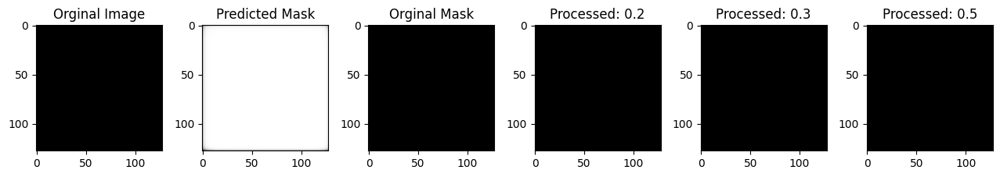

236/236 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - accuracy: 0.6777 - loss: 0.5289
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7338 - loss: 0.417


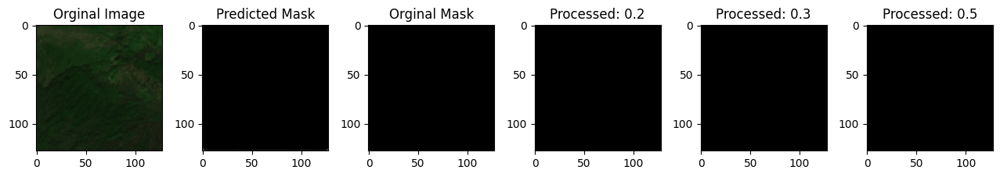

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - accuracy: 0.7338 - loss: 0.4179
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7452 - loss: 0.397


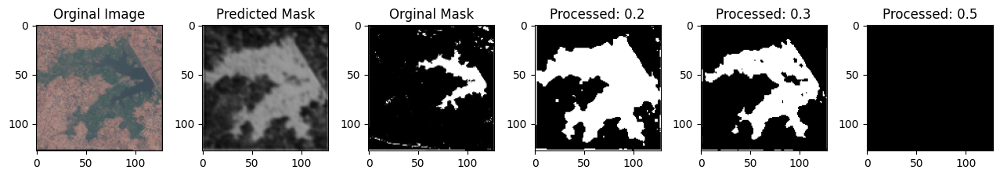

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - accuracy: 0.7452 - loss: 0.3978
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7513 - loss: 0.386


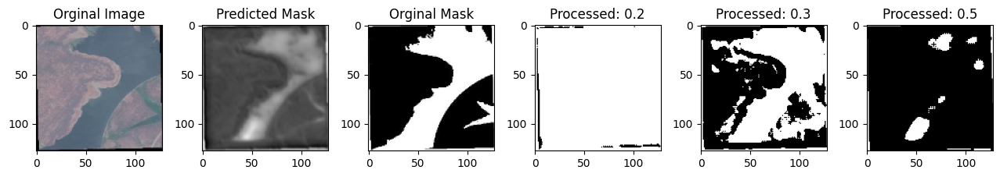

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - accuracy: 0.7513 - loss: 0.3864
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7597 - loss: 0.377


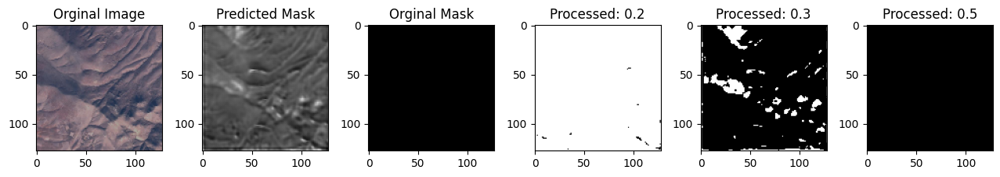

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - accuracy: 0.7597 - loss: 0.3774
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7702 - loss: 0.361


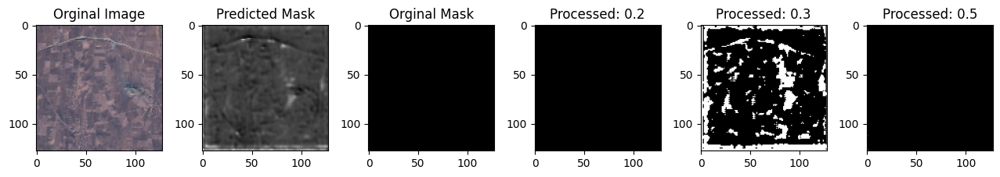

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - accuracy: 0.7701 - loss: 0.3615
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7766 - loss: 0.351


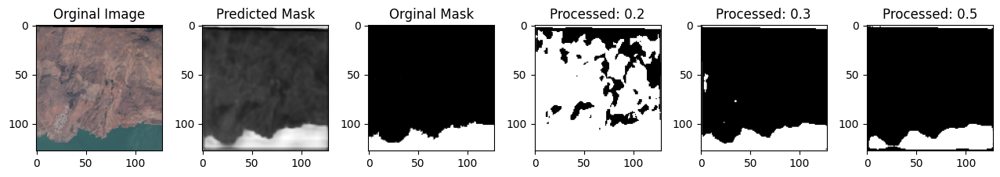

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - accuracy: 0.7766 - loss: 0.3518
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7723 - loss: 0.347


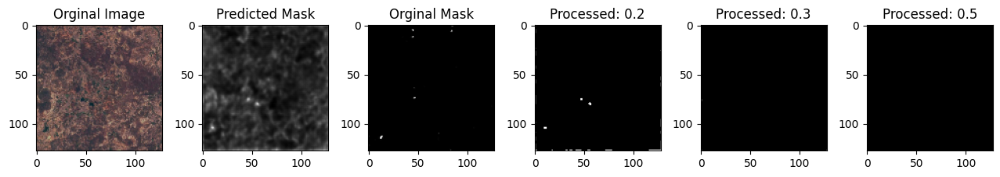

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - accuracy: 0.7723 - loss: 0.3471
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7761 - loss: 0.342


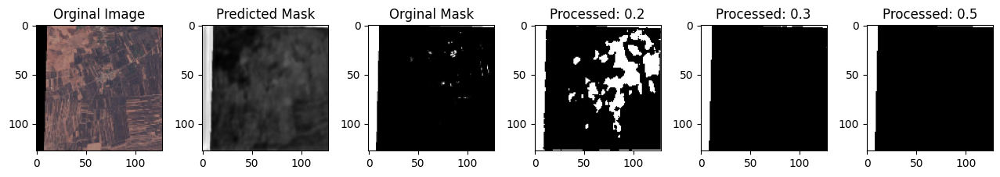

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - accuracy: 0.7761 - loss: 0.3423
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7786 - loss: 0.335


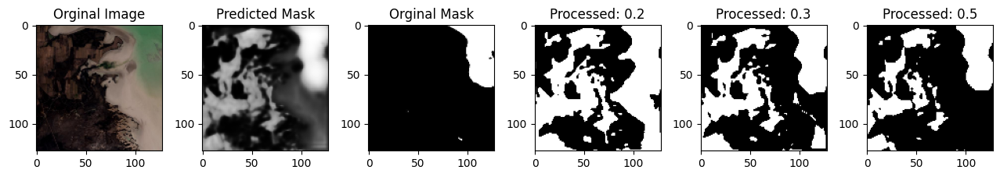

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - accuracy: 0.7786 - loss: 0.3354
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7785 - loss: 0.333


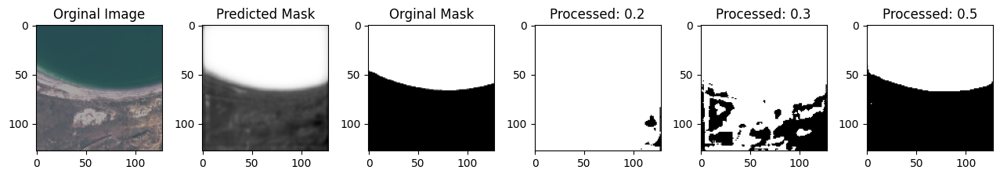

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - accuracy: 0.7785 - loss: 0.3332
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7868 - loss: 0.322


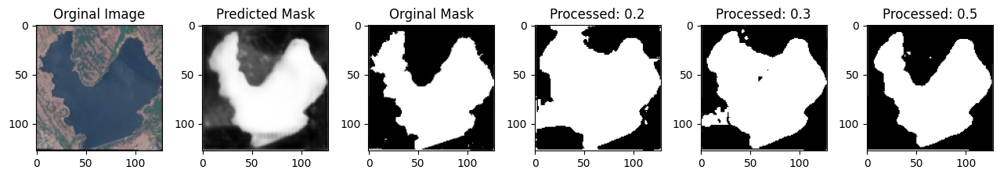

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - accuracy: 0.7868 - loss: 0.3228
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7888 - loss: 0.316


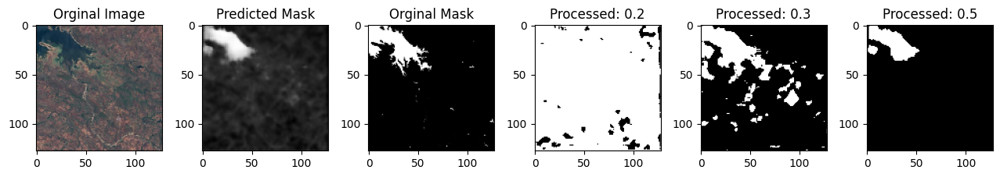

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - accuracy: 0.7887 - loss: 0.3169
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7806 - loss: 0.324


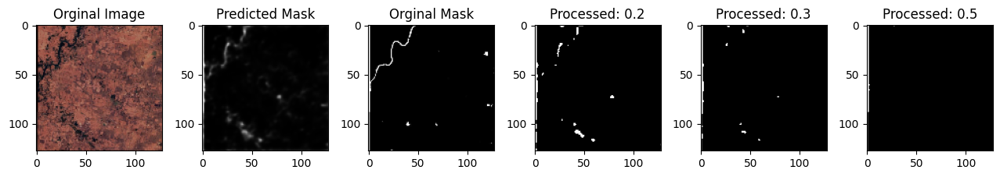

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - accuracy: 0.7806 - loss: 0.3246
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7861 - loss: 0.317


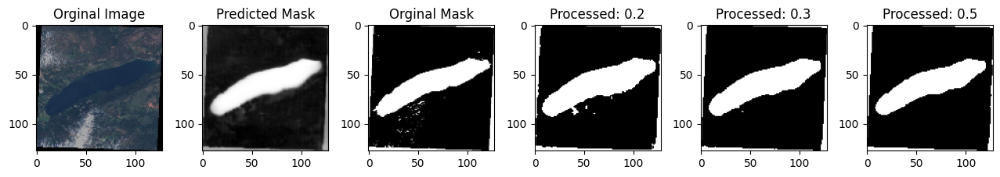

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - accuracy: 0.7861 - loss: 0.3171
Epoch 16/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7831 - loss: 0.322


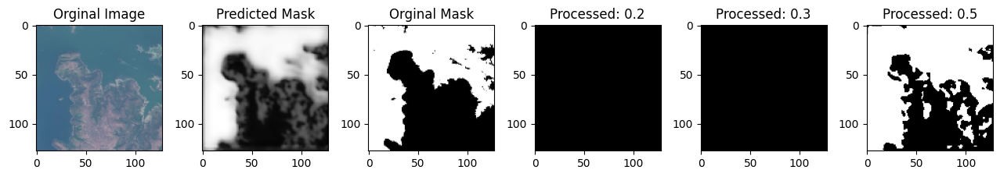

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - accuracy: 0.7831 - loss: 0.3224
Epoch 17/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7909 - loss: 0.310


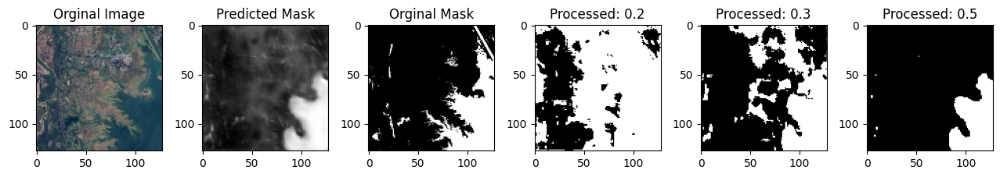

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - accuracy: 0.7909 - loss: 0.3107
Epoch 18/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7920 - loss: 0.309


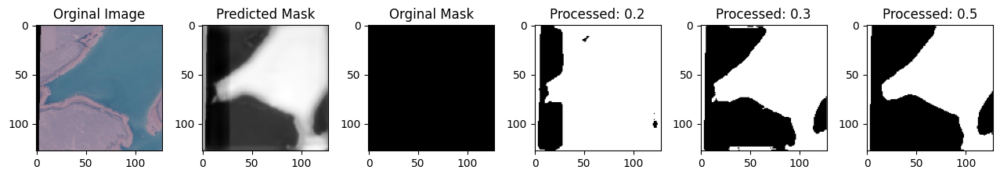

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - accuracy: 0.7920 - loss: 0.3094
Epoch 19/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7828 - loss: 0.328


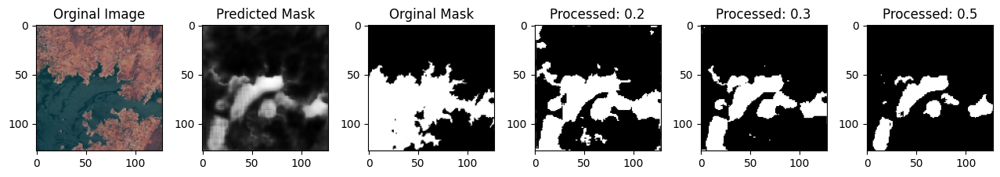

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - accuracy: 0.7828 - loss: 0.3280
Epoch 20/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7874 - loss: 0.313


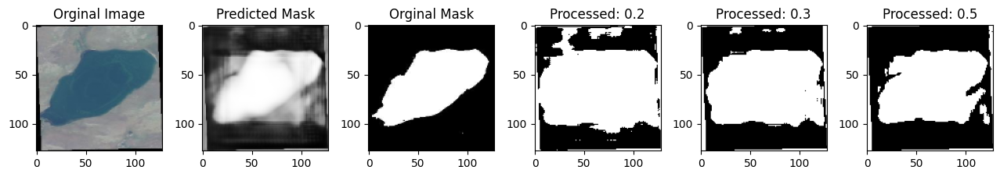

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - accuracy: 0.7874 - loss: 0.3131
Epoch 21/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7931 - loss: 0.303


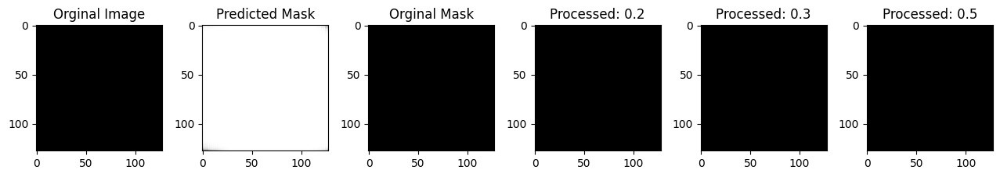

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - accuracy: 0.7931 - loss: 0.3031
Epoch 22/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/stepstep - accuracy: 0.7905 - loss: 0.305


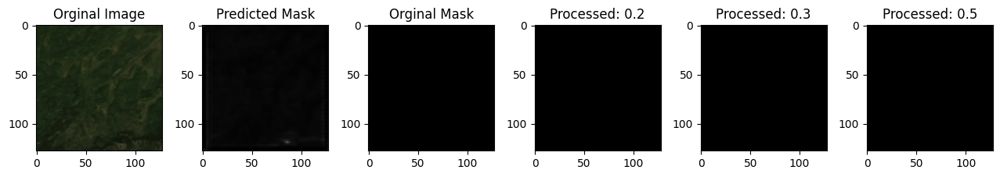

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - accuracy: 0.7905 - loss: 0.3051
Epoch 23/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7970 - loss: 0.297


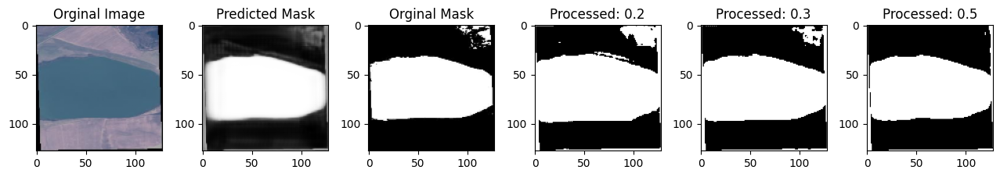

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - accuracy: 0.7970 - loss: 0.2972
Epoch 24/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/stepstep - accuracy: 0.7950 - loss: 0.300


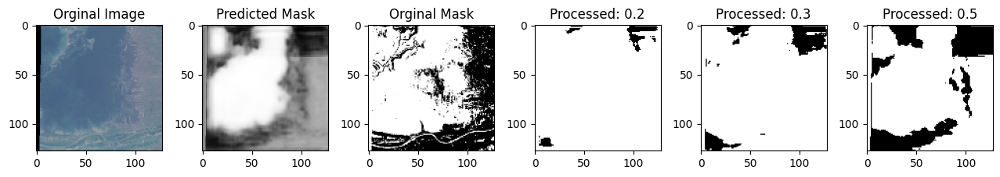

236/236 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step - accuracy: 0.7950 - loss: 0.3007
Epoch 25/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/stepstep - accuracy: 0.7845 - loss: 0.370


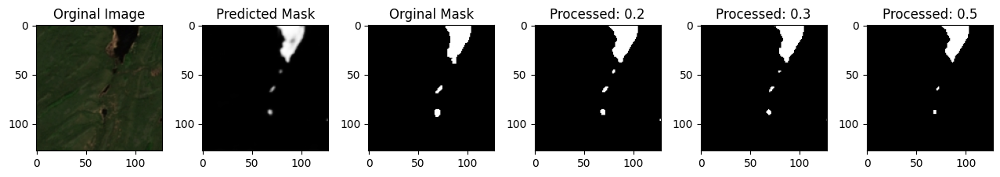

236/236 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step - accuracy: 0.7845 - loss: 0.3705
Epoch 26/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7891 - loss: 0.309


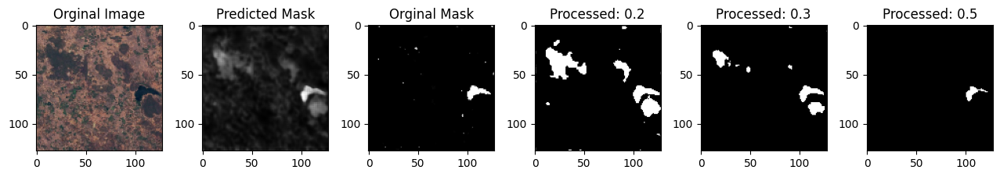

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - accuracy: 0.7890 - loss: 0.3096
Epoch 27/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7867 - loss: 0.318


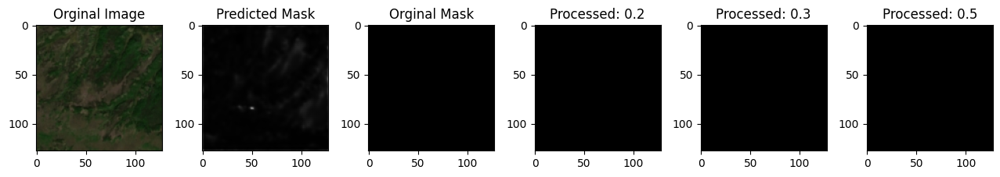

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - accuracy: 0.7867 - loss: 0.3188
Epoch 28/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7899 - loss: 0.316


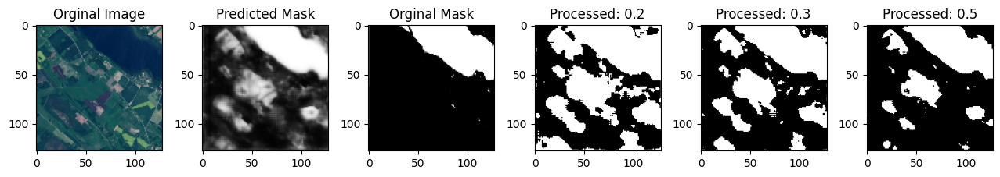

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - accuracy: 0.7899 - loss: 0.3165
Epoch 29/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7926 - loss: 0.307


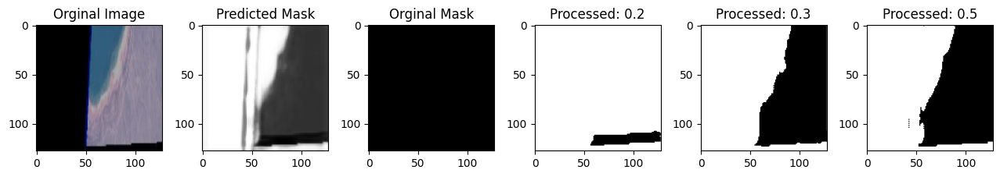

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - accuracy: 0.7926 - loss: 0.3075
Epoch 30/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7925 - loss: 0.308


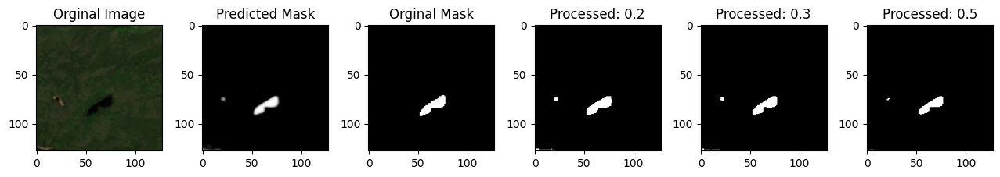

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - accuracy: 0.7925 - loss: 0.3087
Epoch 31/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7871 - loss: 0.321


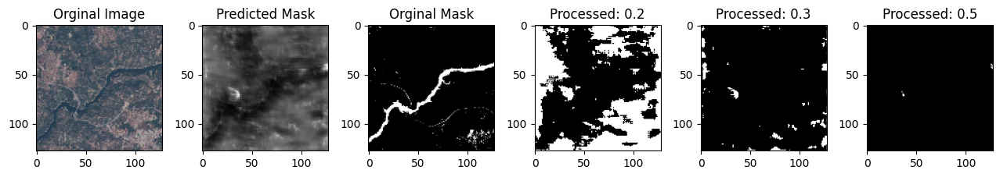

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - accuracy: 0.7871 - loss: 0.3211
Epoch 32/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7844 - loss: 0.319


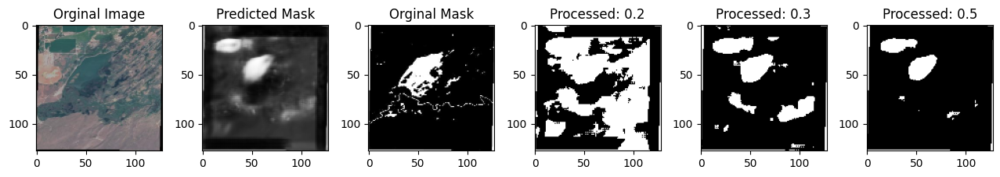

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - accuracy: 0.7844 - loss: 0.3197
Epoch 33/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7935 - loss: 0.302


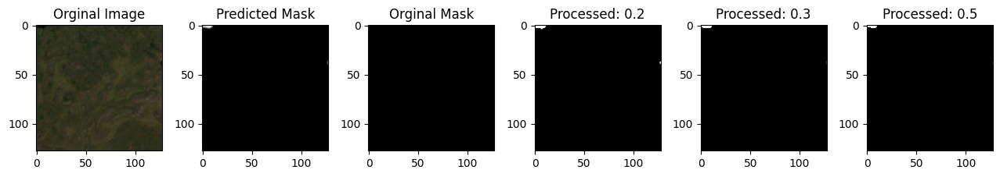

236/236 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - accuracy: 0.7935 - loss: 0.3028
Epoch 34/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7949 - loss: 0.306


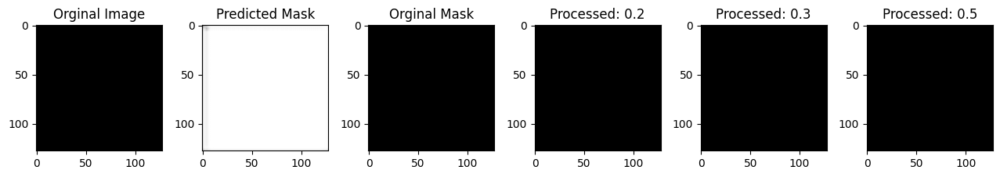

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - accuracy: 0.7949 - loss: 0.3066
Epoch 35/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7922 - loss: 0.309


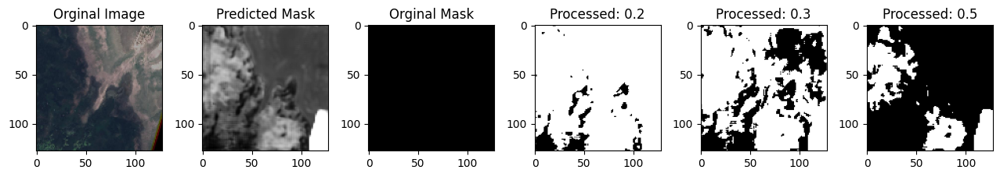

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - accuracy: 0.7922 - loss: 0.3096
Epoch 36/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7909 - loss: 0.305


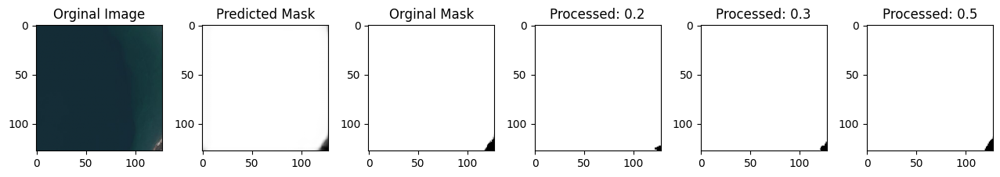

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - accuracy: 0.7909 - loss: 0.3050
Epoch 37/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7951 - loss: 0.303


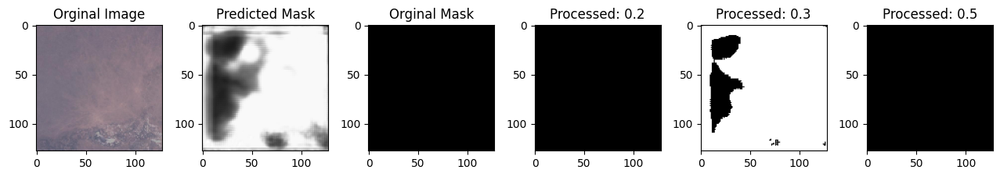

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - accuracy: 0.7951 - loss: 0.3034
Epoch 38/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7946 - loss: 0.299


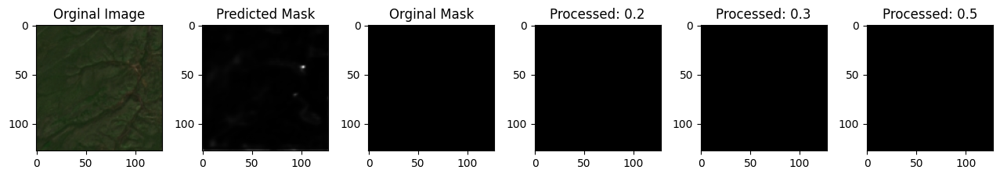

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - accuracy: 0.7945 - loss: 0.2994
Epoch 39/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/stepstep - accuracy: 0.7933 - loss: 0.302


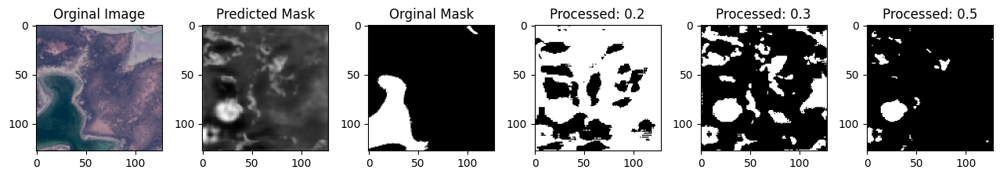

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - accuracy: 0.7933 - loss: 0.3020
Epoch 40/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/stepstep - accuracy: 0.7968 - loss: 0.296


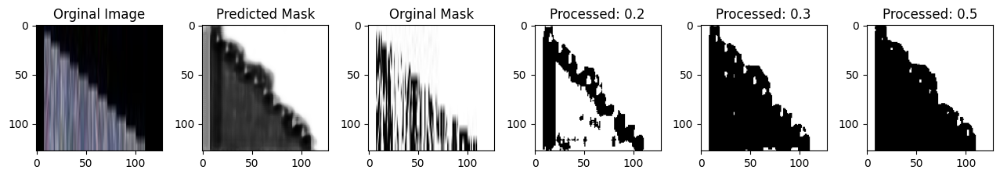

236/236 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - accuracy: 0.7968 - loss: 0.2966
Epoch 41/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/stepstep - accuracy: 0.7949 - loss: 0.301


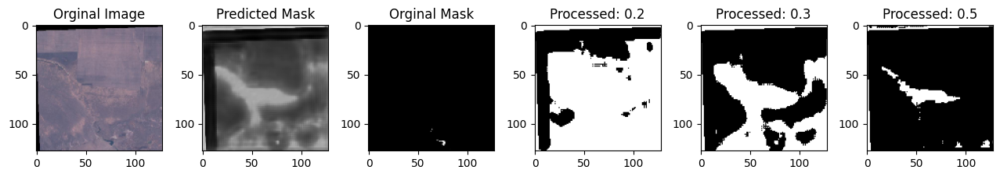

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - accuracy: 0.7949 - loss: 0.3015
Epoch 42/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/stepstep - accuracy: 0.7955 - loss: 0.299


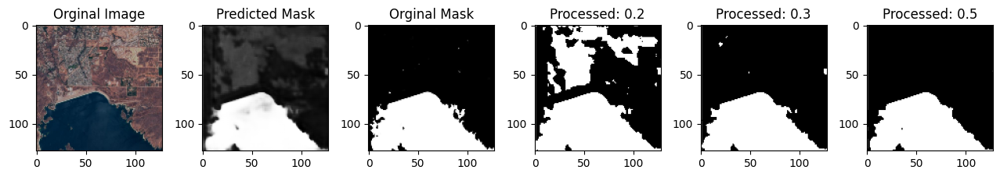

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - accuracy: 0.7955 - loss: 0.2991
Epoch 43/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7951 - loss: 0.300


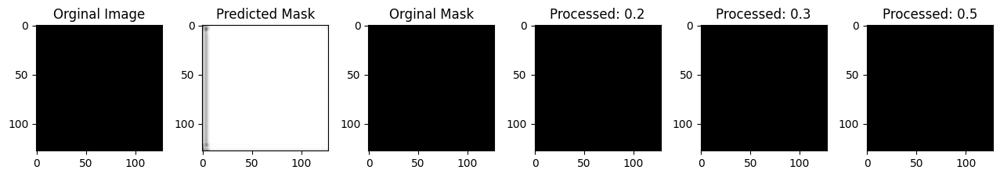

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - accuracy: 0.7951 - loss: 0.3005
Epoch 44/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/stepstep - accuracy: 0.7931 - loss: 0.306


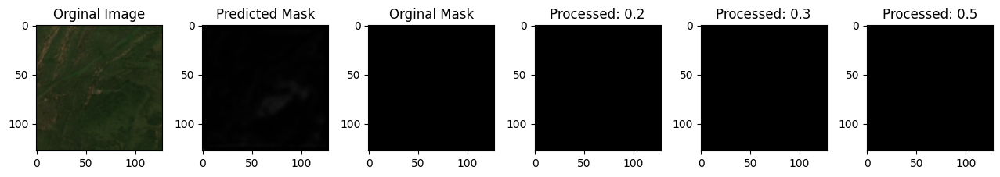

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - accuracy: 0.7931 - loss: 0.3060
Epoch 45/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7956 - loss: 0.296


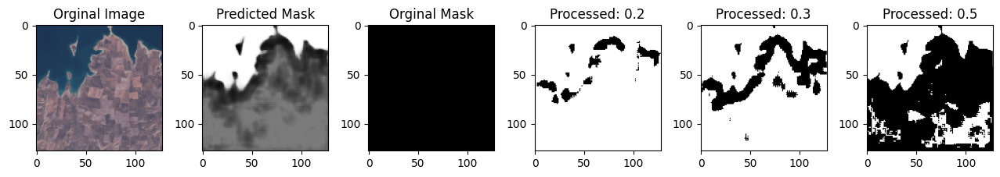

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - accuracy: 0.7956 - loss: 0.2969
Epoch 46/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7923 - loss: 0.298


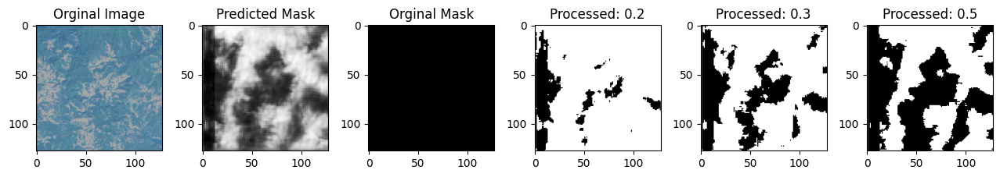

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - accuracy: 0.7923 - loss: 0.2979
Epoch 47/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7935 - loss: 0.297


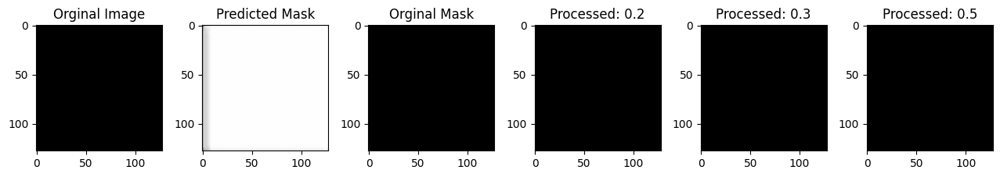

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - accuracy: 0.7935 - loss: 0.2971
Epoch 48/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7984 - loss: 0.296


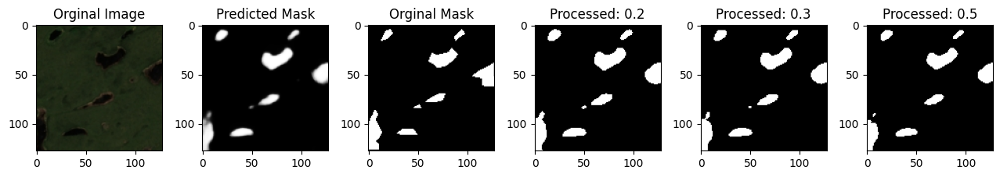

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - accuracy: 0.7984 - loss: 0.2960
Epoch 49/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7972 - loss: 0.293


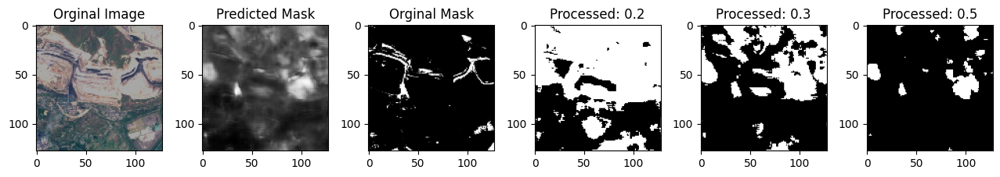

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - accuracy: 0.7973 - loss: 0.2935
Epoch 50/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7989 - loss: 0.291


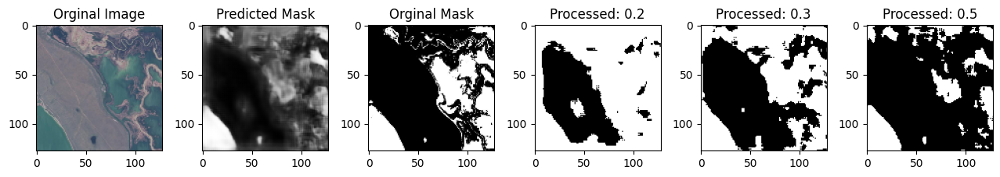

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - accuracy: 0.7989 - loss: 0.2915
Epoch 51/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7975 - loss: 0.29


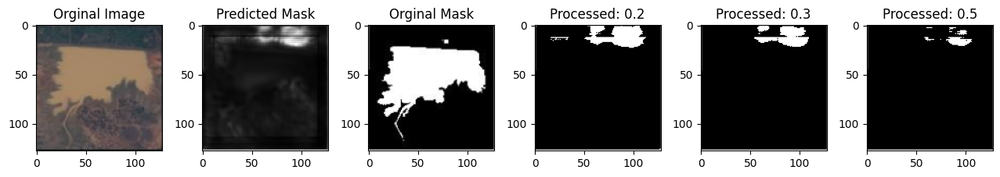

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - accuracy: 0.7975 - loss: 0.2920
Epoch 52/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7976 - loss: 0.293


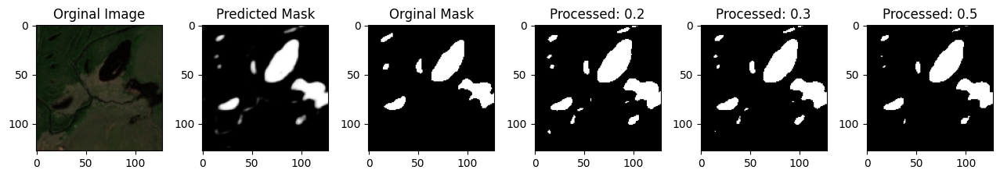

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - accuracy: 0.7976 - loss: 0.2935
Epoch 53/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7974 - loss: 0.288


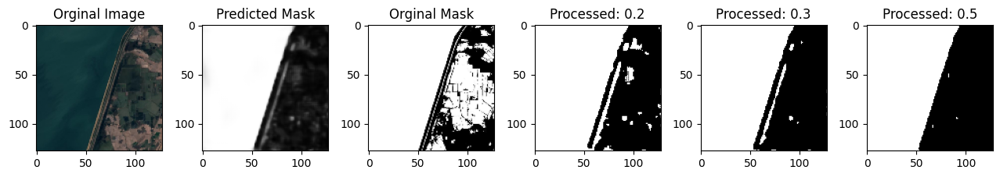

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - accuracy: 0.7974 - loss: 0.2886
Epoch 54/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7988 - loss: 0.290


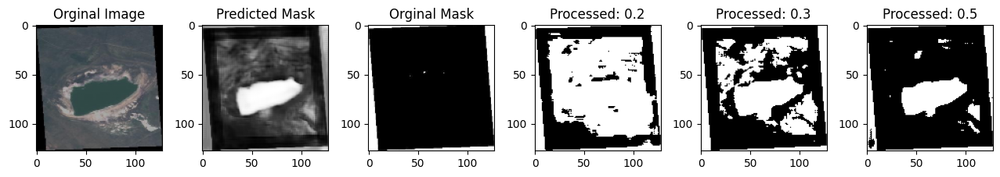

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - accuracy: 0.7988 - loss: 0.2901
Epoch 55/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8062 - loss: 0.28


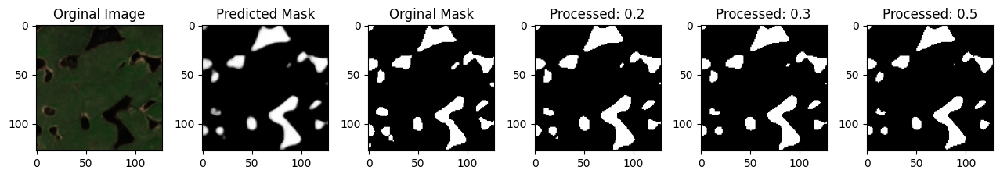

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - accuracy: 0.8062 - loss: 0.2811
Epoch 56/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8007 - loss: 0.283


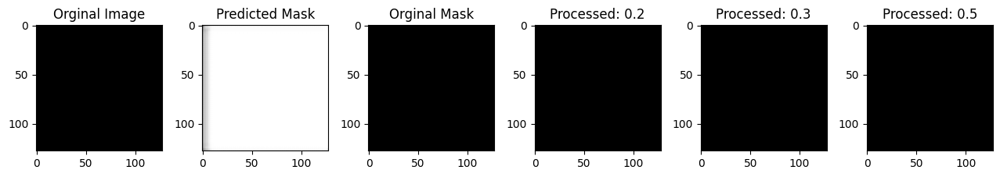

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - accuracy: 0.8007 - loss: 0.2834
Epoch 57/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8037 - loss: 0.28


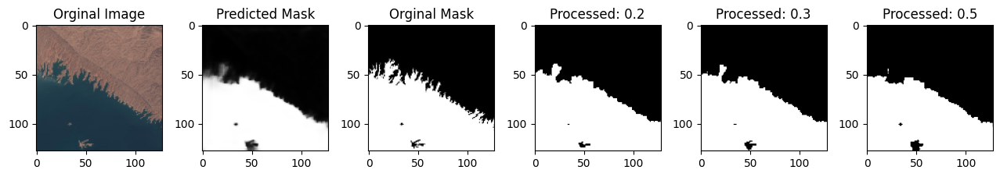

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - accuracy: 0.8037 - loss: 0.2841
Epoch 58/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7995 - loss: 0.287


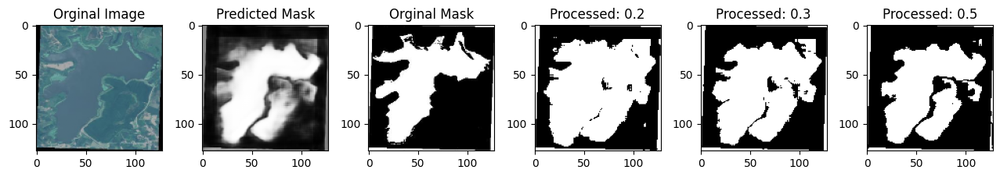

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - accuracy: 0.7995 - loss: 0.2873
Epoch 59/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8077 - loss: 0.27


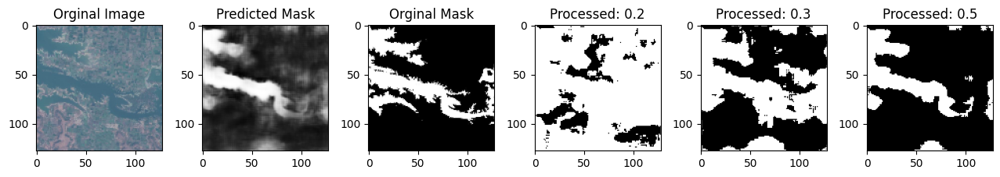

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - accuracy: 0.8076 - loss: 0.2755
Epoch 60/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/stepstep - accuracy: 0.7972 - loss: 0.292


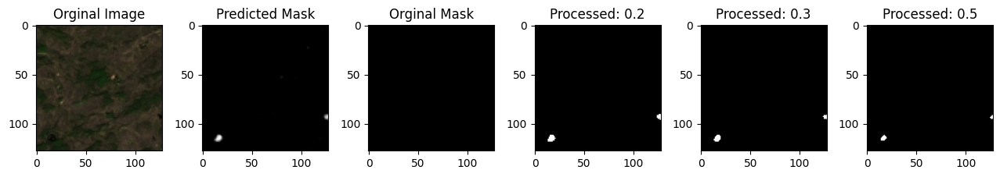

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - accuracy: 0.7972 - loss: 0.2920
Epoch 61/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8052 - loss: 0.27


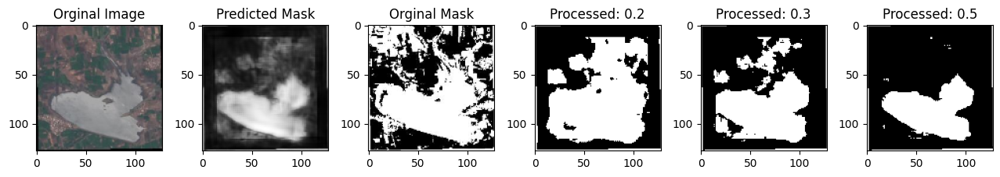

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - accuracy: 0.8051 - loss: 0.2772
Epoch 62/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8041 - loss: 0.278


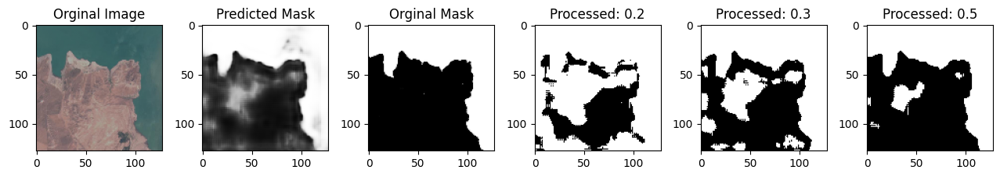

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - accuracy: 0.8041 - loss: 0.2789
Epoch 63/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8001 - loss: 0.284


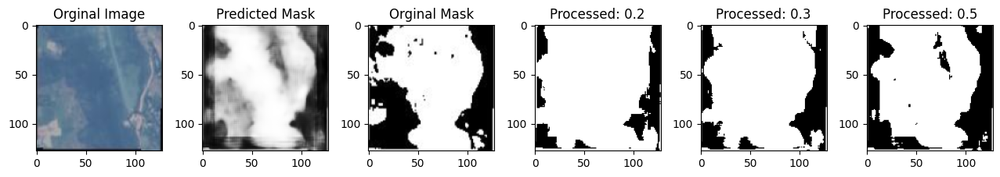

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - accuracy: 0.8001 - loss: 0.2847
Epoch 64/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8005 - loss: 0.283


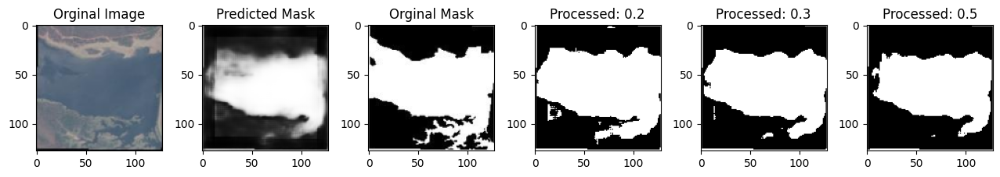

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - accuracy: 0.8006 - loss: 0.2833
Epoch 65/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7988 - loss: 0.28


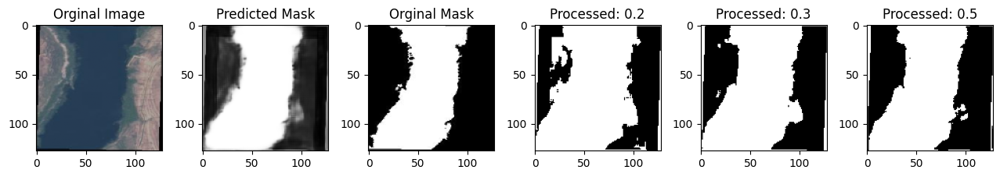

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - accuracy: 0.7988 - loss: 0.2855
Epoch 66/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8083 - loss: 0.27


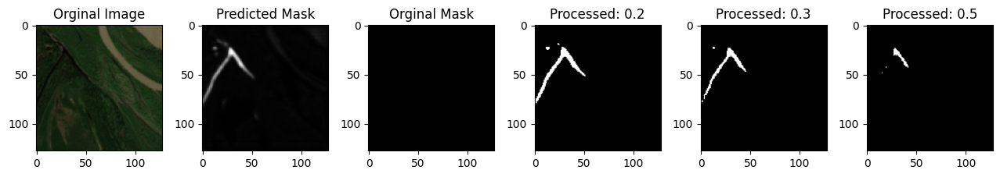

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - accuracy: 0.8083 - loss: 0.2716
Epoch 67/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8085 - loss: 0.275


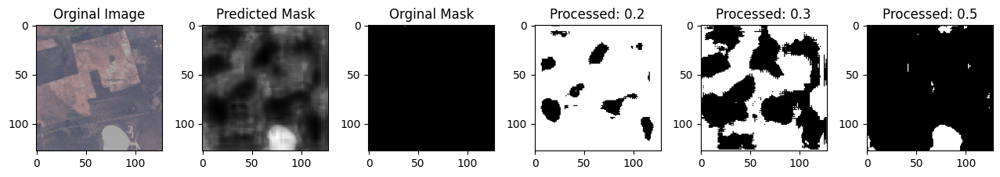

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - accuracy: 0.8085 - loss: 0.2756
Epoch 68/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8076 - loss: 0.274


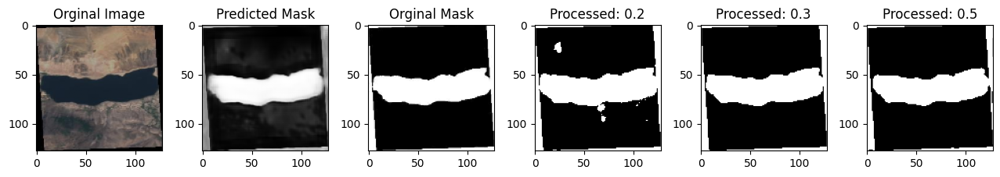

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - accuracy: 0.8076 - loss: 0.2747
Epoch 69/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8114 - loss: 0.26


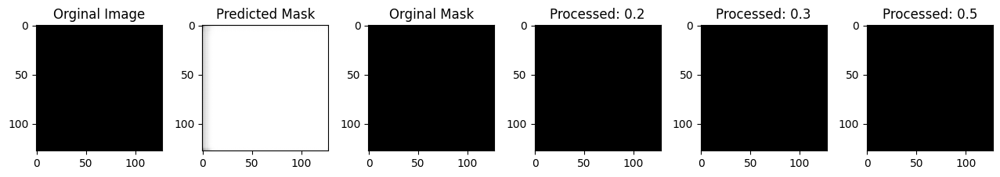

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - accuracy: 0.8114 - loss: 0.2680
Epoch 70/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8043 - loss: 0.275


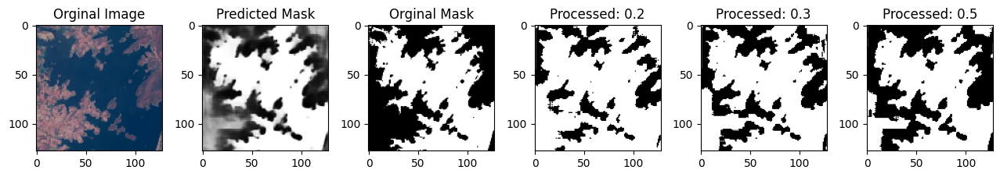

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - accuracy: 0.8043 - loss: 0.2753
Epoch 71/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8062 - loss: 0.275


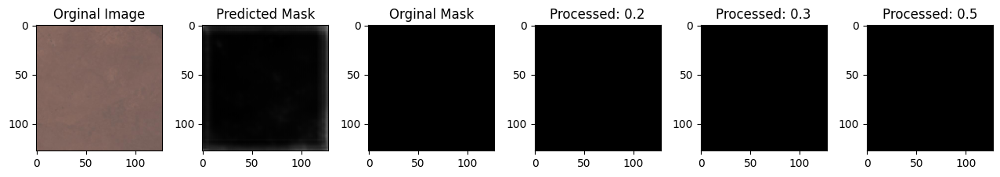

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - accuracy: 0.8062 - loss: 0.2758
Epoch 72/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8033 - loss: 0.27


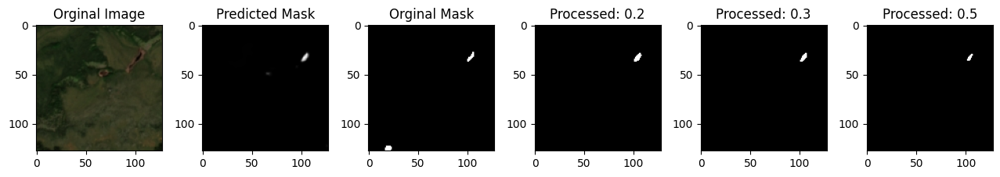

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - accuracy: 0.8033 - loss: 0.2788
Epoch 73/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8111 - loss: 0.26


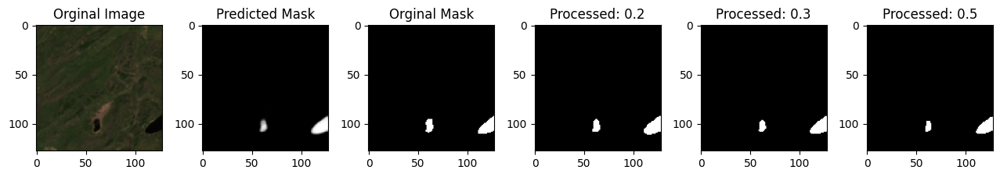

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - accuracy: 0.8111 - loss: 0.2665
Epoch 74/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8068 - loss: 0.27


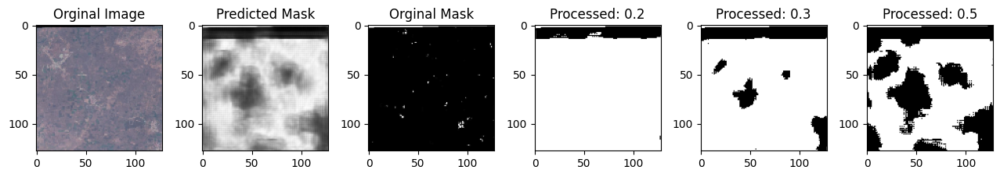

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - accuracy: 0.8068 - loss: 0.2735
Epoch 75/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8053 - loss: 0.274


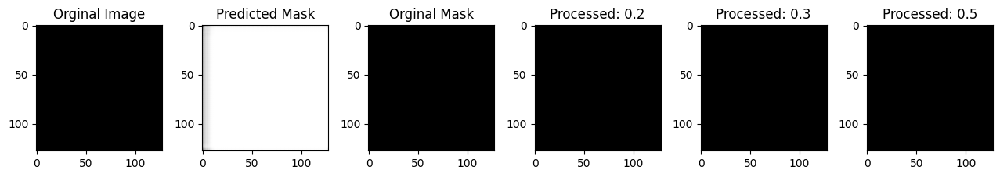

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - accuracy: 0.8054 - loss: 0.2748
Epoch 76/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8066 - loss: 0.272


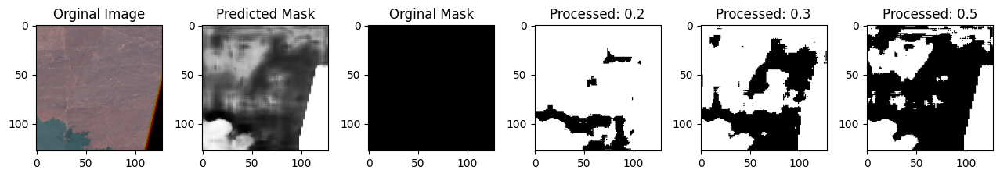

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - accuracy: 0.8066 - loss: 0.2728
Epoch 77/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8100 - loss: 0.266


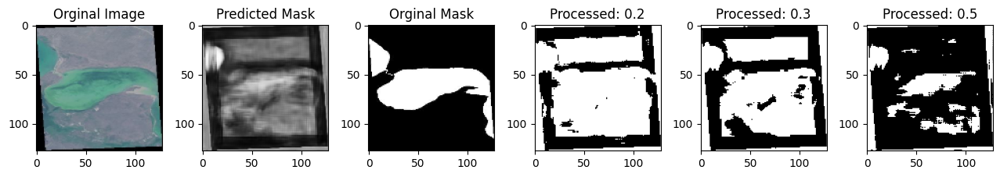

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - accuracy: 0.8100 - loss: 0.2661
Epoch 78/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/stepstep - accuracy: 0.8094 - loss: 0.269


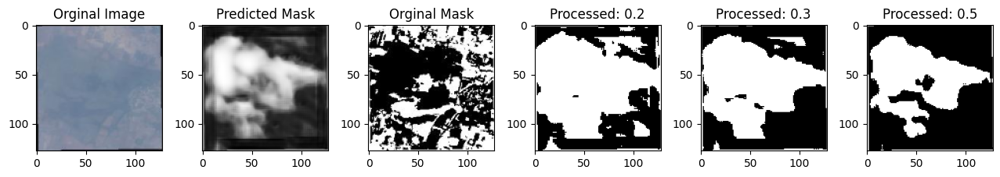

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - accuracy: 0.8094 - loss: 0.2698
Epoch 79/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/stepstep - accuracy: 0.8049 - loss: 0.273


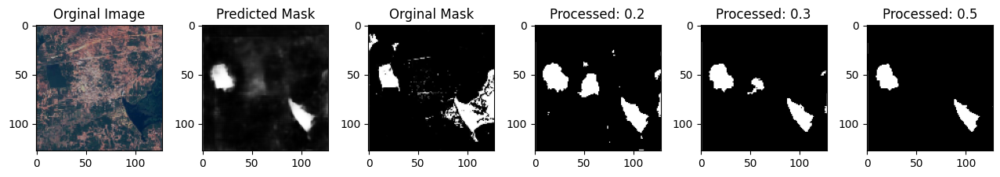

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - accuracy: 0.8049 - loss: 0.2731
Epoch 80/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8091 - loss: 0.268


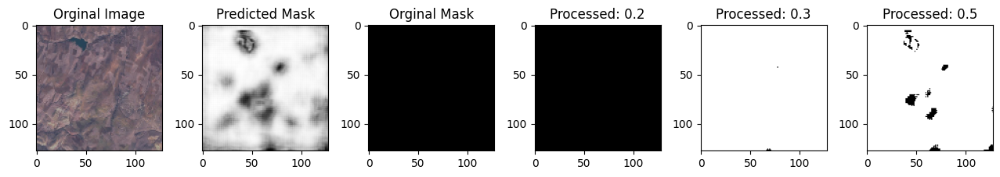

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - accuracy: 0.8091 - loss: 0.2686
Epoch 81/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8090 - loss: 0.268


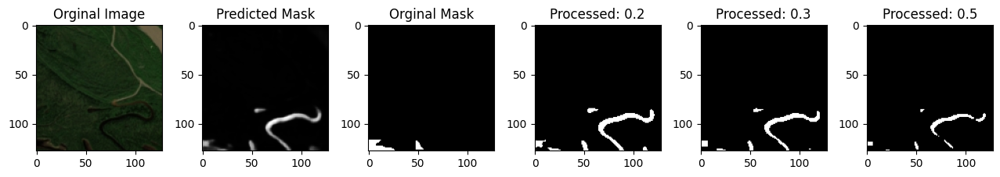

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - accuracy: 0.8090 - loss: 0.2688
Epoch 82/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8077 - loss: 0.27


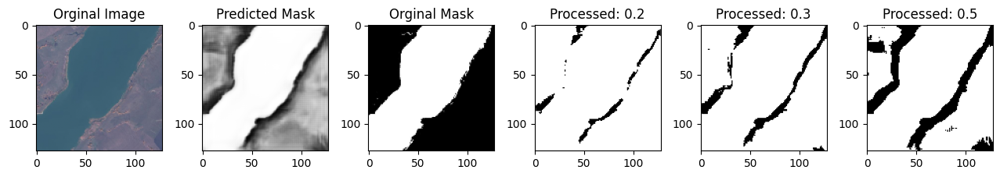

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - accuracy: 0.8077 - loss: 0.2755
Epoch 83/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8089 - loss: 0.266


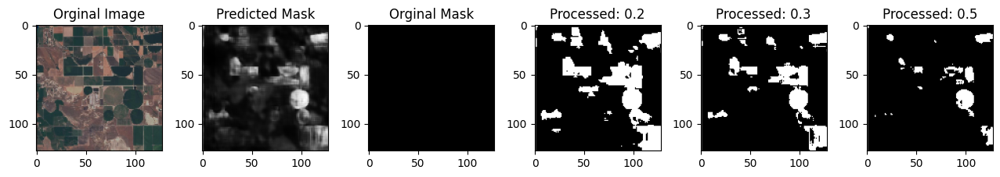

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - accuracy: 0.8089 - loss: 0.2663
Epoch 84/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8129 - loss: 0.265


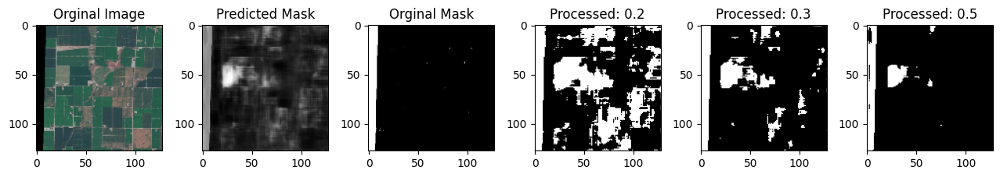

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - accuracy: 0.8129 - loss: 0.2654
Epoch 85/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8111 - loss: 0.266


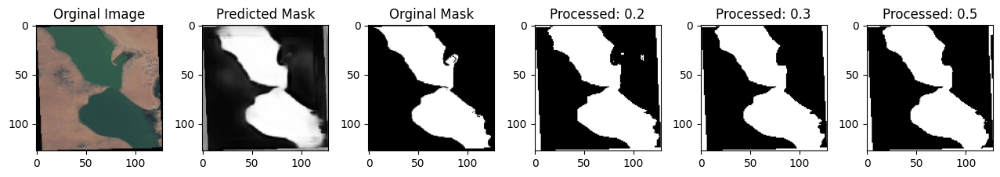

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - accuracy: 0.8111 - loss: 0.2668
Epoch 86/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8112 - loss: 0.264


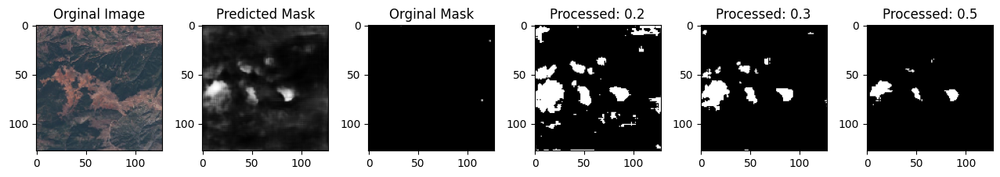

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - accuracy: 0.8112 - loss: 0.2647
Epoch 87/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8116 - loss: 0.26


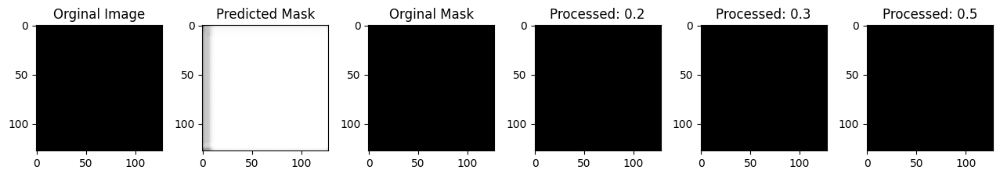

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - accuracy: 0.8116 - loss: 0.2671
Epoch 88/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8084 - loss: 0.27


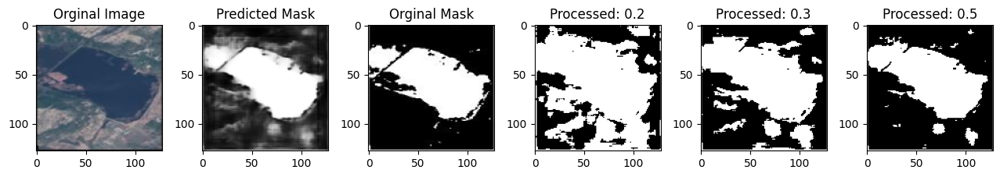

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - accuracy: 0.8084 - loss: 0.2736
Epoch 89/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8139 - loss: 0.25


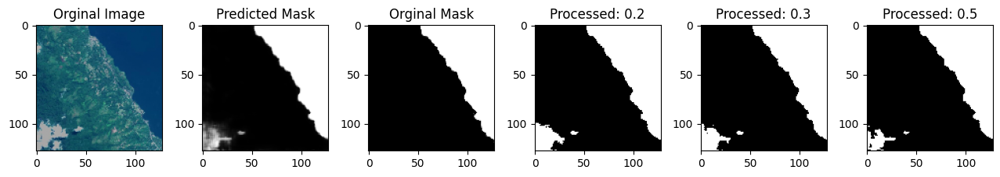

236/236 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - accuracy: 0.8139 - loss: 0.2574
Epoch 90/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8136 - loss: 0.25


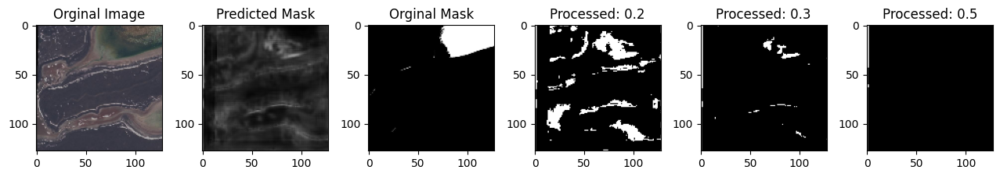

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - accuracy: 0.8136 - loss: 0.2592
Epoch 91/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8118 - loss: 0.266


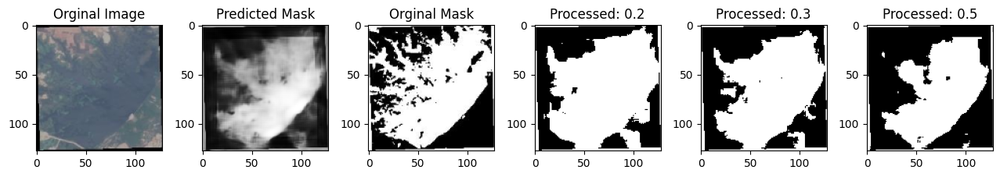

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - accuracy: 0.8118 - loss: 0.2666
Epoch 92/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8107 - loss: 0.264


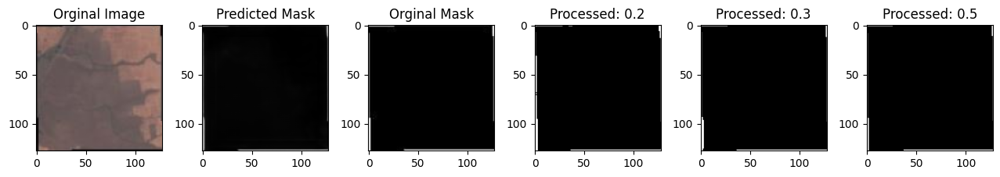

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - accuracy: 0.8107 - loss: 0.2640
Epoch 93/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8124 - loss: 0.265


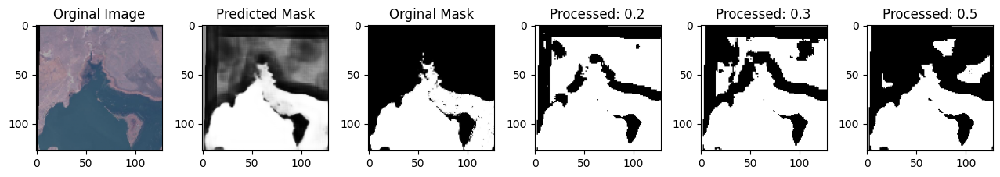

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - accuracy: 0.8124 - loss: 0.2653
Epoch 94/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8133 - loss: 0.259


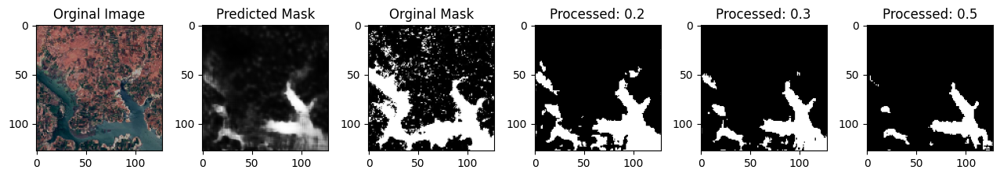

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - accuracy: 0.8133 - loss: 0.2597
Epoch 95/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8093 - loss: 0.26


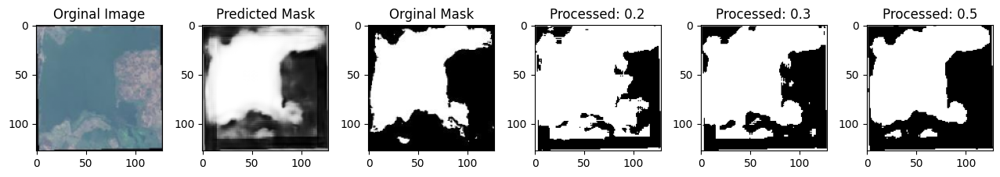

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - accuracy: 0.8094 - loss: 0.2669
Epoch 96/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8160 - loss: 0.253


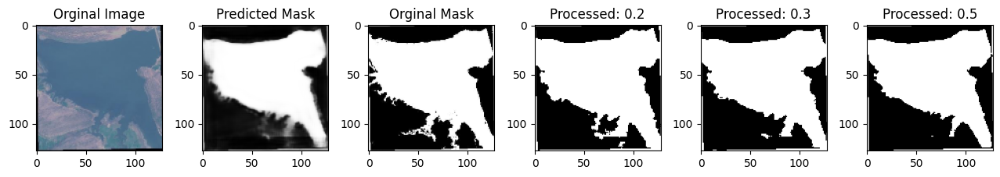

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - accuracy: 0.8159 - loss: 0.2533
Epoch 97/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8093 - loss: 0.264


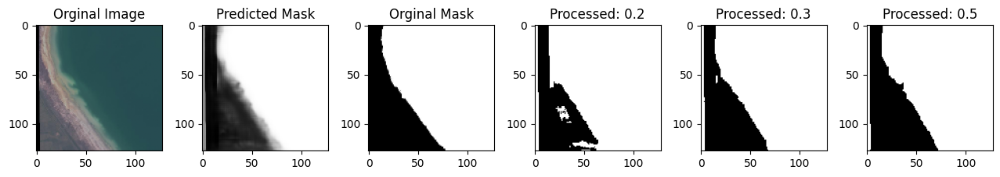

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - accuracy: 0.8093 - loss: 0.2641
Epoch 98/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8168 - loss: 0.255


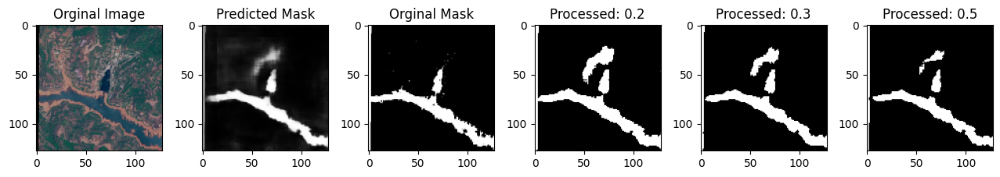

236/236 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - accuracy: 0.8168 - loss: 0.2556
Epoch 99/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8116 - loss: 0.265


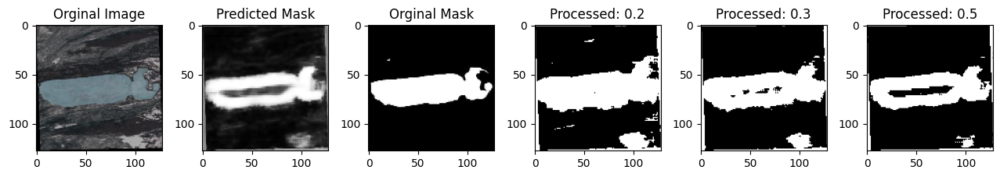

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - accuracy: 0.8116 - loss: 0.2657
Epoch 100/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8128 - loss: 0.259


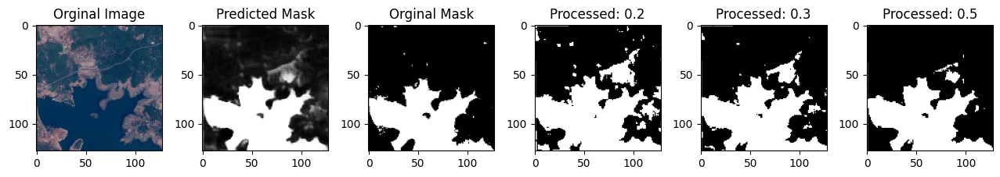

236/236 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - accuracy: 0.8128 - loss: 0.2594


In [17]:
# Training
epochs = 100
batch_size = 32

history = model.fit(images_train, mask_train,
                    epochs=epochs,
                    callbacks=[ShowProgress()],
                    batch_size=batch_size)

In [18]:
from datetime import datetime

# Get the current date and time
current_time = datetime.now().strftime('%Y-%m-%d_%H-%M-%S')

# Save the model with the current date and time in the filename
model.save(f'../models/{current_time}.keras')

In [11]:
# Make predictions
predictions = model.predict(images_test)

KeyError: 'pop from an empty set'